# Best Model In Action

---

In this notebook, we are going to put in action the model we have trained in the previous one.

Here, we are going to follow and to try to reach three objectives:
* Load the model, trained on a GPU, and put it in action on a computer which doesn't benefit from a GPU;
* Check how long it takes to perform inference;
* Perform inferences on submitted images.

As always, the prerequisite step consists on loading the appropriate packages to perform our work:

In [1]:
# Needed packages imports:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import os
import matplotlib as mpl
import matplotlib.pyplot as plt
import cv2, random, torch, torchvision
from utils import get_severstal_dicts

In [2]:
# Needed Detectron2 packages:
import detectron2
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.utils.visualizer import Visualizer

---

## Load the model

In [3]:
# Check information about system profile:
!system_profiler SPHardwareDataType

Hardware:

    Hardware Overview:

      Model Name: MacBook Pro
      Model Identifier: MacBookPro9,2
      Processor Name: Dual-Core Intel Core i5
      Processor Speed: 2,5 GHz
      Number of Processors: 1
      Total Number of Cores: 2
      L2 Cache (per Core): 256 KB
      L3 Cache: 3 MB
      Hyper-Threading Technology: Enabled
      Memory: 4 GB
      Boot ROM Version: 229.0.0.0.0
      SMC Version (system): 2.2f44
      Serial Number (system): C02JC2HXDTY3
      Hardware UUID: F0F7E293-C121-5E28-87C0-D169FDA41B45
      Sudden Motion Sensor:
          State: Enabled



In [4]:
# Set annotations:
severstal_annotations = ['Type 1', 'Type 2', 'Type 3', 'Type 4']

# Register training and testing datasets:
for ds in ['training_ds', 'testing_ds']:
    DatasetCatalog.register(ds, lambda ds=ds: get_severstal_dicts('../data/' + ds + '/'))
    MetadataCatalog.get(ds).set(thing_classes=severstal_annotations)

# Set metadata:
severstal_metadata = MetadataCatalog.get('training_ds')

In [5]:
# Build predicor:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file('COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml'))
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4
cfg.MODEL.WEIGHTS = '../models/best_model/training/model_final.pth'
cfg.MODEL.DEVICE = 'cpu'
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7
predictor = DefaultPredictor(cfg)

---

## Time to perform inference

In [6]:
# Get all image in testing dataset:
testing_ds_imgs = []
for element in os.listdir('../data/testing_ds'):
    if element.split('.')[-1] == 'jpg':
        testing_ds_imgs.append(element)

# Check if all has been OK:
print("*** Quick check:")
print("- Testing dataset counts {} images.".format(len(testing_ds_imgs)))
print("- One example of image in this dataset is '{}'.".format(testing_ds_imgs[42]))

*** Quick check:
- Testing dataset counts 1675 images.
- One example of image in this dataset is 'd048a5a71.jpg'.


In [7]:
# Build list of images to treat:
inference_images_lst = []
for element in testing_ds_imgs:
    img_path = '../data/testing_ds/' + element
    img = cv2.imread(img_path)
    inference_images_lst.append(img)

In [8]:
%%time
for element in inference_images_lst:
    outputs = predictor(element)

/Users/mrksinant/Documents/miniconda3/envs/Severstal/lib/python3.8/site-packages/detectron2/layers/wrappers.py:226: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /Users/distiller/project/conda/conda-bld/pytorch_1595629449223/work/torch/csrc/utils/python_arg_parser.cpp:766.)
  return x.nonzero().unbind(1)


CPU times: user 2h 13min 2s, sys: 7min 4s, total: 2h 20min 6s
Wall time: 2h 3min 22s


---

## Perform inferences

In [9]:
# Get training and testing datasets dictionaries lists:
training_ds_dicts = get_severstal_dicts('../data/training_ds/')
testing_ds_dicts = get_severstal_dicts('../data/testing_ds/')

In [10]:
# Pick up ten random recordings on training dataset:
random_training = random.sample(training_ds_dicts, 10)

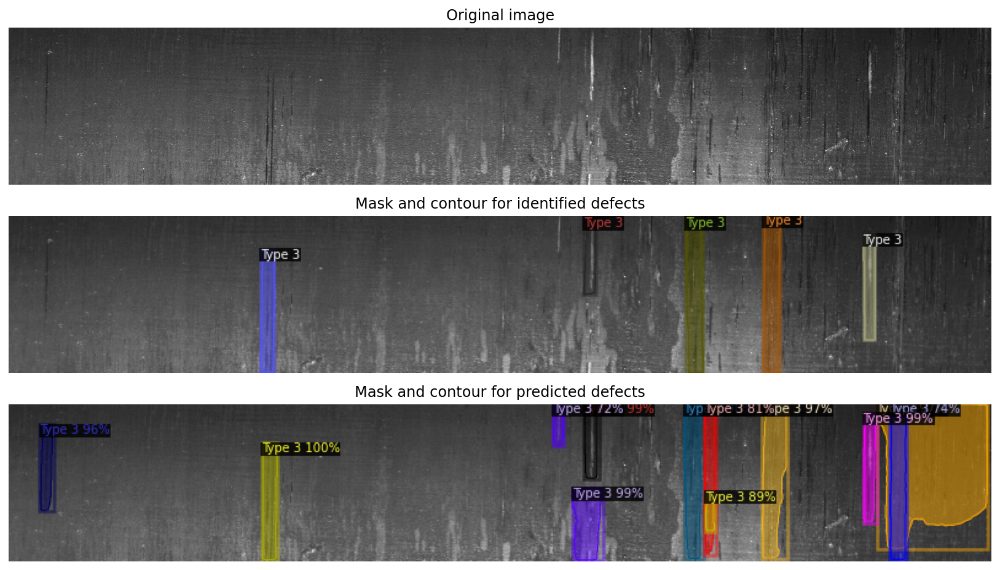

In [11]:
# First random prediction:
img = cv2.imread(random_training[0]['file_name'])

# Original image:
img_ori = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Mask and contour for identified defects:
visualizer = Visualizer(img[:, :, ::-1],
                        metadata=severstal_metadata,
                        scale=0.5)
out = visualizer.draw_dataset_dict(random_training[0])
img_true = cv2.cvtColor(out.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB)

# Mask and contour for predicted defects:
outputs = predictor(img)
visualizer_pred = Visualizer(img[:, :, ::-1],
                             metadata=severstal_metadata,
                             scale=0.5)
pred = visualizer_pred.draw_instance_predictions(outputs['instances'].to('cpu'))
img_pred = cv2.cvtColor(pred.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB)

# Define the graph:
fig, axes = plt.subplots(3, figsize=(18, 8))

# Configuration of the graph:
axes[0].set_title("Original image")
axes[0].imshow(img_ori)
axes[0].axis('off')
axes[1].set_title("Mask and contour for identified defects")
axes[1].imshow(img_true)
axes[1].axis('off')
axes[2].set_title("Mask and contour for predicted defects")
axes[2].imshow(img_pred)
axes[2].axis('off')

# Save the graph:
fig.savefig('../graphs/inference_random_1.png', bbox_inches='tight')

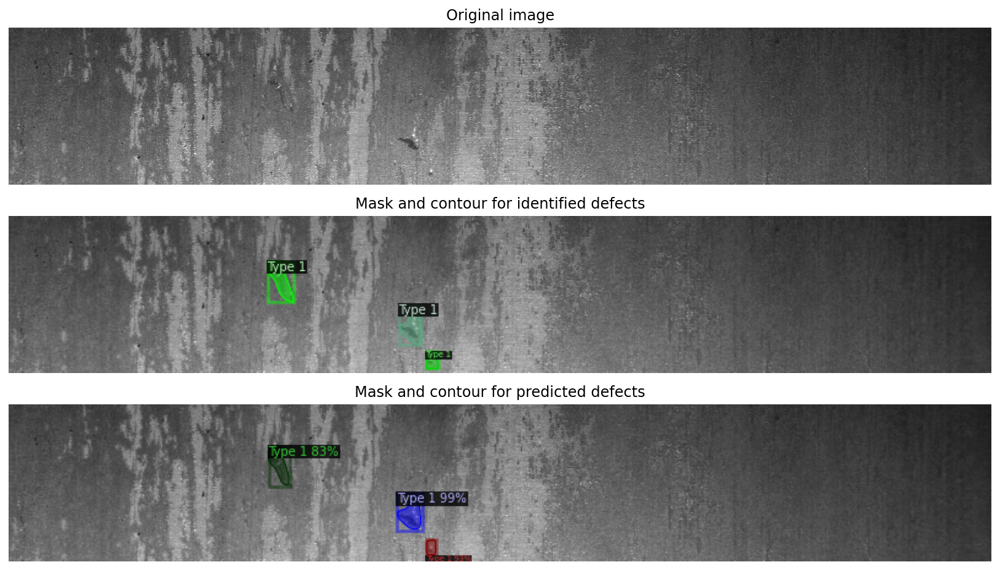

In [12]:
# Second random prediction:
img = cv2.imread(random_training[1]['file_name'])

# Original image:
img_ori = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Mask and contour for identified defects:
visualizer = Visualizer(img[:, :, ::-1],
                        metadata=severstal_metadata,
                        scale=0.5)
out = visualizer.draw_dataset_dict(random_training[1])
img_true = cv2.cvtColor(out.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB)

# Mask and contour for predicted defects:
outputs = predictor(img)
visualizer_pred = Visualizer(img[:, :, ::-1],
                             metadata=severstal_metadata,
                             scale=0.5)
pred = visualizer_pred.draw_instance_predictions(outputs['instances'].to('cpu'))
img_pred = cv2.cvtColor(pred.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB)

# Define the graph:
fig, axes = plt.subplots(3, figsize=(18, 8))

# Configuration of the graph:
axes[0].set_title("Original image")
axes[0].imshow(img_ori)
axes[0].axis('off')
axes[1].set_title("Mask and contour for identified defects")
axes[1].imshow(img_true)
axes[1].axis('off')
axes[2].set_title("Mask and contour for predicted defects")
axes[2].imshow(img_pred)
axes[2].axis('off')

# Save the graph:
fig.savefig('../graphs/inference_random_2.png', bbox_inches='tight')

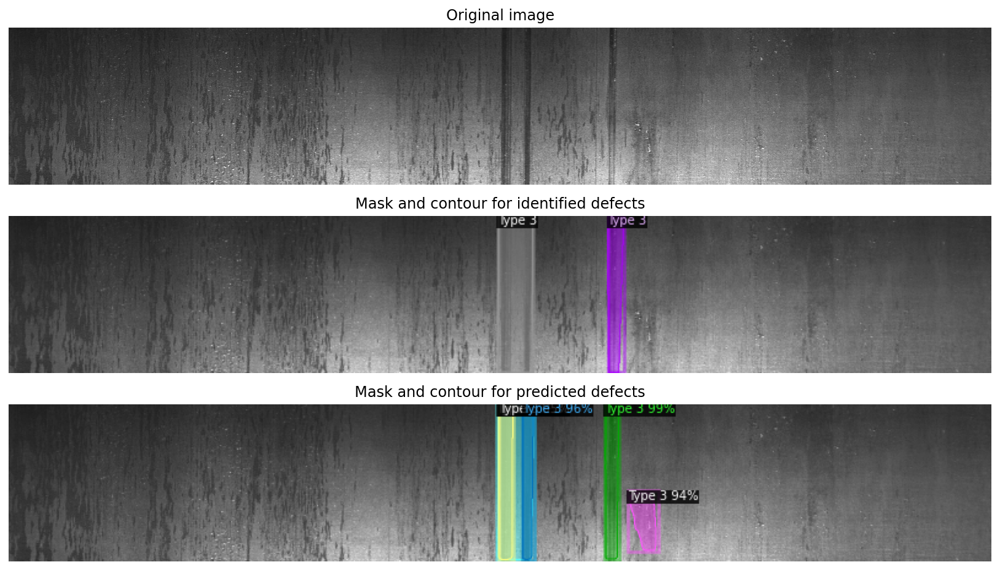

In [13]:
# Third random prediction:
img = cv2.imread(random_training[2]['file_name'])

# Original image:
img_ori = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Mask and contour for identified defects:
visualizer = Visualizer(img[:, :, ::-1],
                        metadata=severstal_metadata,
                        scale=0.5)
out = visualizer.draw_dataset_dict(random_training[2])
img_true = cv2.cvtColor(out.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB)

# Mask and contour for predicted defects:
outputs = predictor(img)
visualizer_pred = Visualizer(img[:, :, ::-1],
                             metadata=severstal_metadata,
                             scale=0.5)
pred = visualizer_pred.draw_instance_predictions(outputs['instances'].to('cpu'))
img_pred = cv2.cvtColor(pred.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB)

# Define the graph:
fig, axes = plt.subplots(3, figsize=(18, 8))

# Configuration of the graph:
axes[0].set_title("Original image")
axes[0].imshow(img_ori)
axes[0].axis('off')
axes[1].set_title("Mask and contour for identified defects")
axes[1].imshow(img_true)
axes[1].axis('off')
axes[2].set_title("Mask and contour for predicted defects")
axes[2].imshow(img_pred)
axes[2].axis('off')

# Save the graph:
fig.savefig('../graphs/inference_random_3.png', bbox_inches='tight')

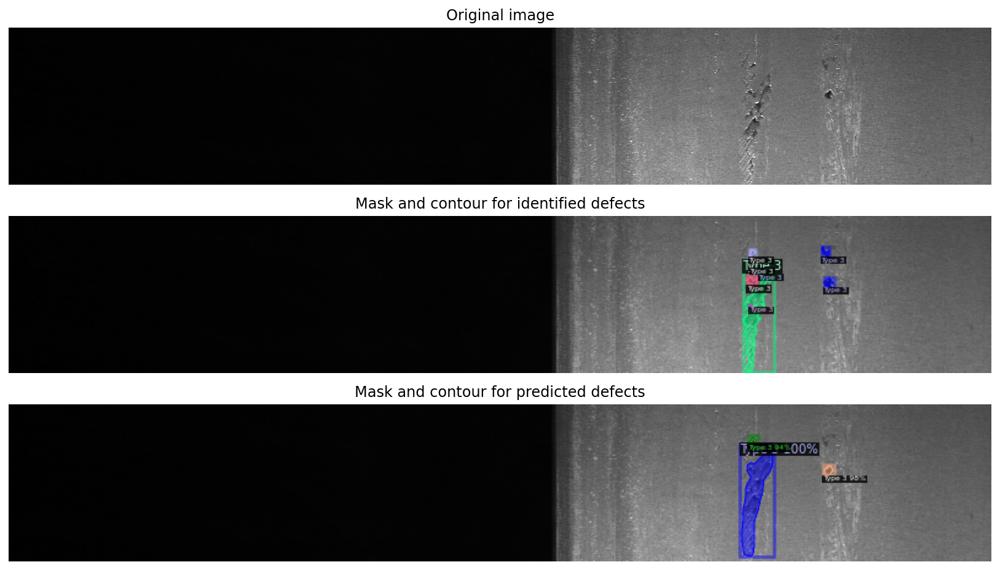

In [14]:
# Fourth random prediction:
img = cv2.imread(random_training[3]['file_name'])

# Original image:
img_ori = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Mask and contour for identified defects:
visualizer = Visualizer(img[:, :, ::-1],
                        metadata=severstal_metadata,
                        scale=0.5)
out = visualizer.draw_dataset_dict(random_training[3])
img_true = cv2.cvtColor(out.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB)

# Mask and contour for predicted defects:
outputs = predictor(img)
visualizer_pred = Visualizer(img[:, :, ::-1],
                             metadata=severstal_metadata,
                             scale=0.5)
pred = visualizer_pred.draw_instance_predictions(outputs['instances'].to('cpu'))
img_pred = cv2.cvtColor(pred.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB)

# Define the graph:
fig, axes = plt.subplots(3, figsize=(18, 8))

# Configuration of the graph:
axes[0].set_title("Original image")
axes[0].imshow(img_ori)
axes[0].axis('off')
axes[1].set_title("Mask and contour for identified defects")
axes[1].imshow(img_true)
axes[1].axis('off')
axes[2].set_title("Mask and contour for predicted defects")
axes[2].imshow(img_pred)
axes[2].axis('off')

# Save the graph:
fig.savefig('../graphs/inference_random_4.png', bbox_inches='tight')

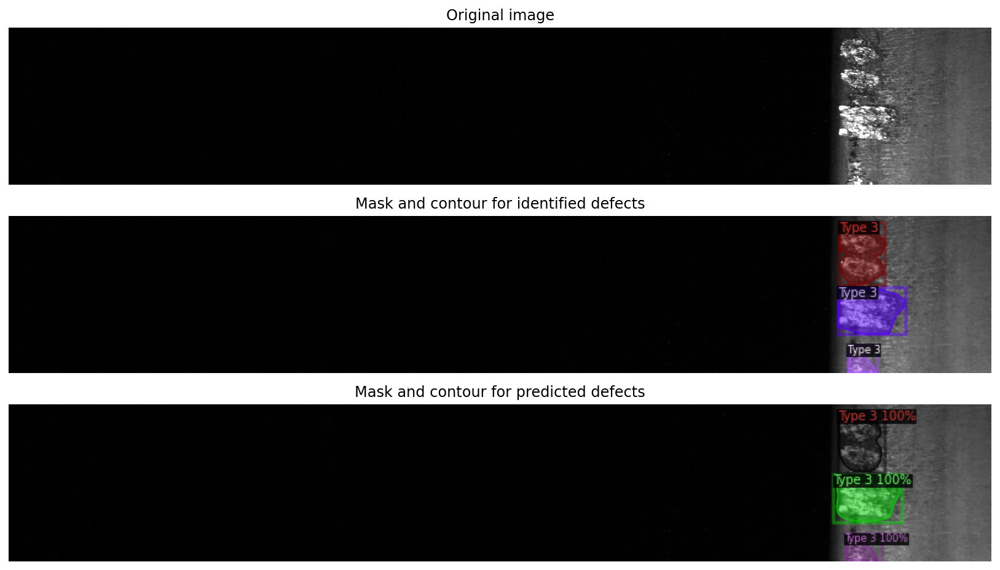

In [15]:
# Fifth random prediction:
img = cv2.imread(random_training[4]['file_name'])

# Original image:
img_ori = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Mask and contour for identified defects:
visualizer = Visualizer(img[:, :, ::-1],
                        metadata=severstal_metadata,
                        scale=0.5)
out = visualizer.draw_dataset_dict(random_training[4])
img_true = cv2.cvtColor(out.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB)

# Mask and contour for predicted defects:
outputs = predictor(img)
visualizer_pred = Visualizer(img[:, :, ::-1],
                             metadata=severstal_metadata,
                             scale=0.5)
pred = visualizer_pred.draw_instance_predictions(outputs['instances'].to('cpu'))
img_pred = cv2.cvtColor(pred.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB)

# Define the graph:
fig, axes = plt.subplots(3, figsize=(18, 8))

# Configuration of the graph:
axes[0].set_title("Original image")
axes[0].imshow(img_ori)
axes[0].axis('off')
axes[1].set_title("Mask and contour for identified defects")
axes[1].imshow(img_true)
axes[1].axis('off')
axes[2].set_title("Mask and contour for predicted defects")
axes[2].imshow(img_pred)
axes[2].axis('off')

# Save the graph:
fig.savefig('../graphs/inference_random_5.png', bbox_inches='tight')

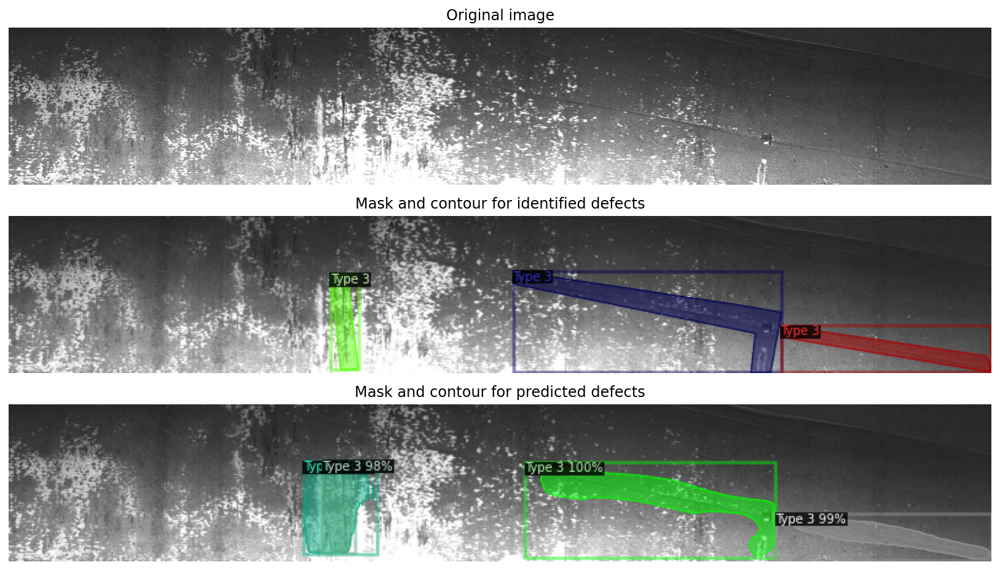

In [16]:
# Sixth random prediction:
img = cv2.imread(random_training[5]['file_name'])

# Original image:
img_ori = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Mask and contour for identified defects:
visualizer = Visualizer(img[:, :, ::-1],
                        metadata=severstal_metadata,
                        scale=0.5)
out = visualizer.draw_dataset_dict(random_training[5])
img_true = cv2.cvtColor(out.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB)

# Mask and contour for predicted defects:
outputs = predictor(img)
visualizer_pred = Visualizer(img[:, :, ::-1],
                             metadata=severstal_metadata,
                             scale=0.5)
pred = visualizer_pred.draw_instance_predictions(outputs['instances'].to('cpu'))
img_pred = cv2.cvtColor(pred.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB)

# Define the graph:
fig, axes = plt.subplots(3, figsize=(18, 8))

# Configuration of the graph:
axes[0].set_title("Original image")
axes[0].imshow(img_ori)
axes[0].axis('off')
axes[1].set_title("Mask and contour for identified defects")
axes[1].imshow(img_true)
axes[1].axis('off')
axes[2].set_title("Mask and contour for predicted defects")
axes[2].imshow(img_pred)
axes[2].axis('off')

# Save the graph:
fig.savefig('../graphs/inference_random_6.png', bbox_inches='tight')

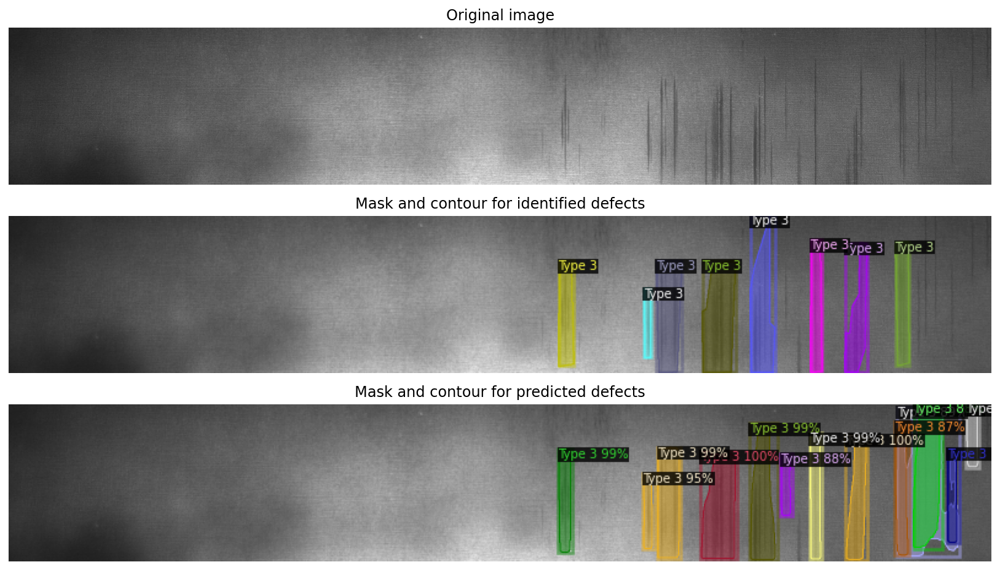

In [17]:
# Seventh random prediction:
img = cv2.imread(random_training[6]['file_name'])

# Original image:
img_ori = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Mask and contour for identified defects:
visualizer = Visualizer(img[:, :, ::-1],
                        metadata=severstal_metadata,
                        scale=0.5)
out = visualizer.draw_dataset_dict(random_training[6])
img_true = cv2.cvtColor(out.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB)

# Mask and contour for predicted defects:
outputs = predictor(img)
visualizer_pred = Visualizer(img[:, :, ::-1],
                             metadata=severstal_metadata,
                             scale=0.5)
pred = visualizer_pred.draw_instance_predictions(outputs['instances'].to('cpu'))
img_pred = cv2.cvtColor(pred.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB)

# Define the graph:
fig, axes = plt.subplots(3, figsize=(18, 8))

# Configuration of the graph:
axes[0].set_title("Original image")
axes[0].imshow(img_ori)
axes[0].axis('off')
axes[1].set_title("Mask and contour for identified defects")
axes[1].imshow(img_true)
axes[1].axis('off')
axes[2].set_title("Mask and contour for predicted defects")
axes[2].imshow(img_pred)
axes[2].axis('off')

# Save the graph:
fig.savefig('../graphs/inference_random_7.png', bbox_inches='tight')

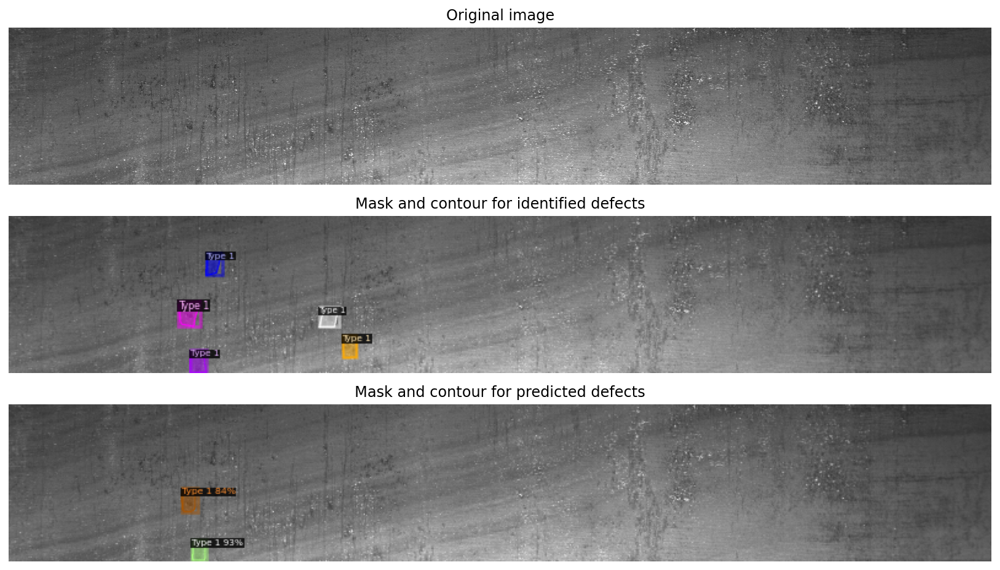

In [18]:
# Eighth random prediction:
img = cv2.imread(random_training[7]['file_name'])

# Original image:
img_ori = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Mask and contour for identified defects:
visualizer = Visualizer(img[:, :, ::-1],
                        metadata=severstal_metadata,
                        scale=0.5)
out = visualizer.draw_dataset_dict(random_training[7])
img_true = cv2.cvtColor(out.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB)

# Mask and contour for predicted defects:
outputs = predictor(img)
visualizer_pred = Visualizer(img[:, :, ::-1],
                             metadata=severstal_metadata,
                             scale=0.5)
pred = visualizer_pred.draw_instance_predictions(outputs['instances'].to('cpu'))
img_pred = cv2.cvtColor(pred.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB)

# Define the graph:
fig, axes = plt.subplots(3, figsize=(18, 8))

# Configuration of the graph:
axes[0].set_title("Original image")
axes[0].imshow(img_ori)
axes[0].axis('off')
axes[1].set_title("Mask and contour for identified defects")
axes[1].imshow(img_true)
axes[1].axis('off')
axes[2].set_title("Mask and contour for predicted defects")
axes[2].imshow(img_pred)
axes[2].axis('off')

# Save the graph:
fig.savefig('../graphs/inference_random_8.png', bbox_inches='tight')

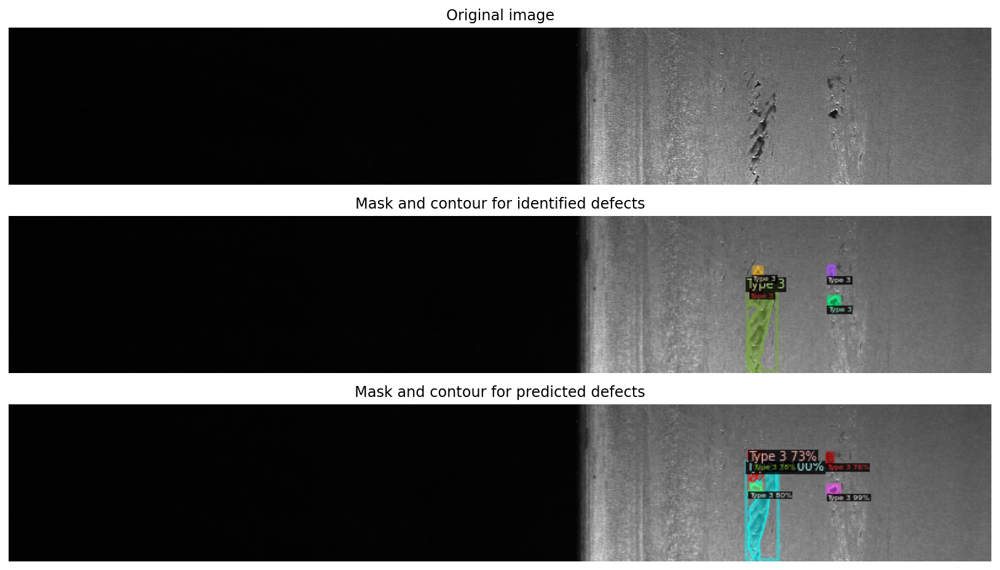

In [19]:
# Ninth random prediction:
img = cv2.imread(random_training[8]['file_name'])

# Original image:
img_ori = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Mask and contour for identified defects:
visualizer = Visualizer(img[:, :, ::-1],
                        metadata=severstal_metadata,
                        scale=0.5)
out = visualizer.draw_dataset_dict(random_training[8])
img_true = cv2.cvtColor(out.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB)

# Mask and contour for predicted defects:
outputs = predictor(img)
visualizer_pred = Visualizer(img[:, :, ::-1],
                             metadata=severstal_metadata,
                             scale=0.5)
pred = visualizer_pred.draw_instance_predictions(outputs['instances'].to('cpu'))
img_pred = cv2.cvtColor(pred.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB)

# Define the graph:
fig, axes = plt.subplots(3, figsize=(18, 8))

# Configuration of the graph:
axes[0].set_title("Original image")
axes[0].imshow(img_ori)
axes[0].axis('off')
axes[1].set_title("Mask and contour for identified defects")
axes[1].imshow(img_true)
axes[1].axis('off')
axes[2].set_title("Mask and contour for predicted defects")
axes[2].imshow(img_pred)
axes[2].axis('off')

# Save the graph:
fig.savefig('../graphs/inference_random_9.png', bbox_inches='tight')

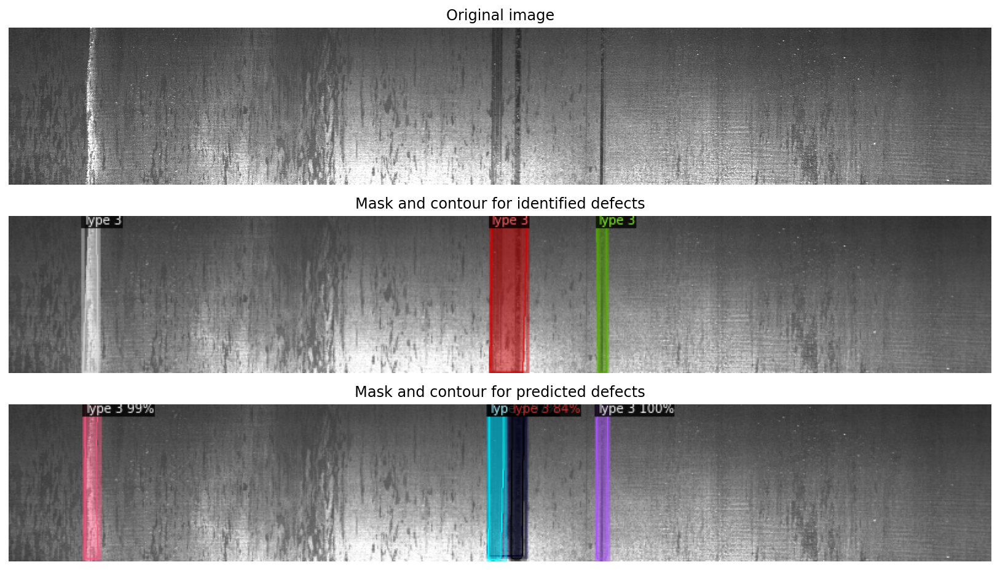

In [20]:
# Tenth random prediction:
img = cv2.imread(random_training[9]['file_name'])

# Original image:
img_ori = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Mask and contour for identified defects:
visualizer = Visualizer(img[:, :, ::-1],
                        metadata=severstal_metadata,
                        scale=0.5)
out = visualizer.draw_dataset_dict(random_training[9])
img_true = cv2.cvtColor(out.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB)

# Mask and contour for predicted defects:
outputs = predictor(img)
visualizer_pred = Visualizer(img[:, :, ::-1],
                             metadata=severstal_metadata,
                             scale=0.5)
pred = visualizer_pred.draw_instance_predictions(outputs['instances'].to('cpu'))
img_pred = cv2.cvtColor(pred.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB)

# Define the graph:
fig, axes = plt.subplots(3, figsize=(18, 8))

# Configuration of the graph:
axes[0].set_title("Original image")
axes[0].imshow(img_ori)
axes[0].axis('off')
axes[1].set_title("Mask and contour for identified defects")
axes[1].imshow(img_true)
axes[1].axis('off')
axes[2].set_title("Mask and contour for predicted defects")
axes[2].imshow(img_pred)
axes[2].axis('off')

# Save the graph:
fig.savefig('../graphs/inference_random_10.png', bbox_inches='tight')

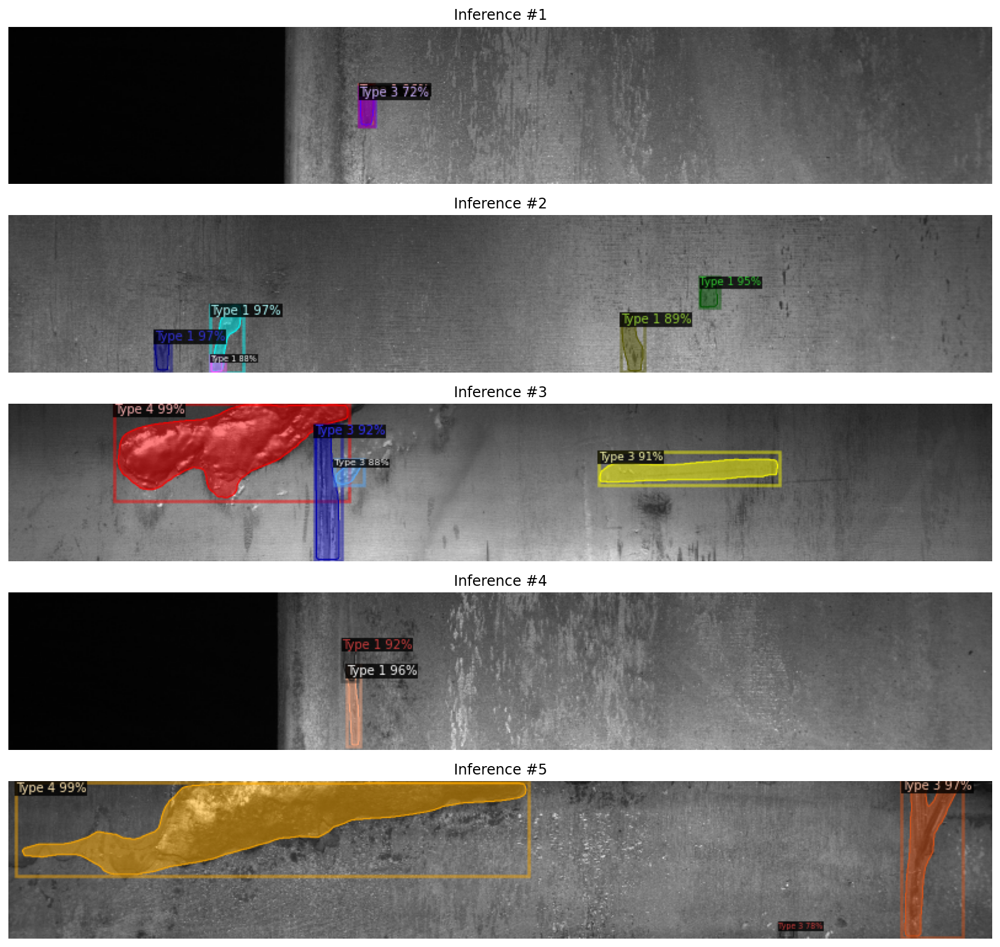

In [21]:
# Random predictions on testing dataset:

# Inference on a random set from testing dataset:
random_testing_pred = []
for recording in random.sample(testing_ds_dicts, 5):
    img = cv2.imread(recording['file_name'])
    outputs = predictor(img)
    visualizer_pred = Visualizer(img[:, :, ::-1],
                                 metadata=severstal_metadata,
                                 scale=0.5)
    pred = visualizer_pred.draw_instance_predictions(outputs['instances'].to('cpu'))
    img_pred = cv2.cvtColor(pred.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB)
    random_testing_pred.append(img_pred)

# Define the graph:
fig, axes = plt.subplots(5, figsize=(24, 14))

# Configuration of the graph:
axes[0].set_title("Inference #1")
axes[0].imshow(random_testing_pred[0])
axes[0].axis('off')
axes[1].set_title("Inference #2")
axes[1].imshow(random_testing_pred[1])
axes[1].axis('off')
axes[2].set_title("Inference #3")
axes[2].imshow(random_testing_pred[2])
axes[2].axis('off')
axes[3].set_title("Inference #4")
axes[3].imshow(random_testing_pred[3])
axes[3].axis('off')
axes[4].set_title("Inference #5")
axes[4].imshow(random_testing_pred[4])
axes[4].axis('off')

# Save the graph:
fig.savefig('../graphs/inference_set.png', bbox_inches='tight')